# Multi-class Dog Bread Classification(Google Colab)

> It is used to build a multi-class image classifier using Tensorflow(2.0) and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

## 2. Data

The data we are using has been provided by the kaggle website under the Dog Breed identification dataset.

Link -> https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

Link -> https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Information of the data:-

* Dealing with images of dogs(unstructured data). So it is best we either use Deep learning or transfer learning.
* There are 120 breeds of dogs which means that there are 120 different classes/categories of dogs.
* There are around 10,000+ images in both the training and the test dataset.(The images of the training set are labelled whereas the test set are not as we want to predict them)



In [1]:
# from google.colab import drive
# drive.mount('/content/drive')

In [2]:
 # Import Tensorflow and Tensorflow Hub in colab

import tensorflow as tf
import tensorflow_hub as hub

print('Tensorflow version: ', tf.__version__)
print('Tensorflow Hub version: ', hub.__version__)

Tensorflow version:  2.7.0
Tensorflow Hub version:  0.12.0


In [3]:
# Checking if a GPU is available
print('GPU', 'available' if tf.config.list_physical_devices("GPU") else 'not available')

GPU available


In [4]:
print("Devices", tf.config.list_physical_devices())

Devices [PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [5]:
# Changed the runtime to use a GPU. Checking to see if it worked. From 'runtime' then click 'change runtime type' and then select 'GPU' option.
print("Devices", tf.config.list_physical_devices())
print('GPU', 'available' if tf.config.list_physical_devices("GPU") else 'not available')

Devices [PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
GPU available


# Getting the data

> With all machine learning models, we have to convert the data in numerical format. Turning the images into tensors(numerical representation).

In [6]:
# Importing the data into colab
import pandas as pd

df= pd.read_csv('./drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/labels.csv')
print(df.head())
print(df.describe())


                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever
                                      id               breed
count                              10222               10222
unique                             10222                 120
top     17f5ba5fee5bbebe781009cf8d3e1809  scottish_deerhound
freq                                   1                 126


In [7]:
df.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [8]:
df['breed'].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
komondor                 67
brabancon_griffon        67
golden_retriever         67
briard                   66
eskimo_dog               66
Name: breed, Length: 120, dtype: int64

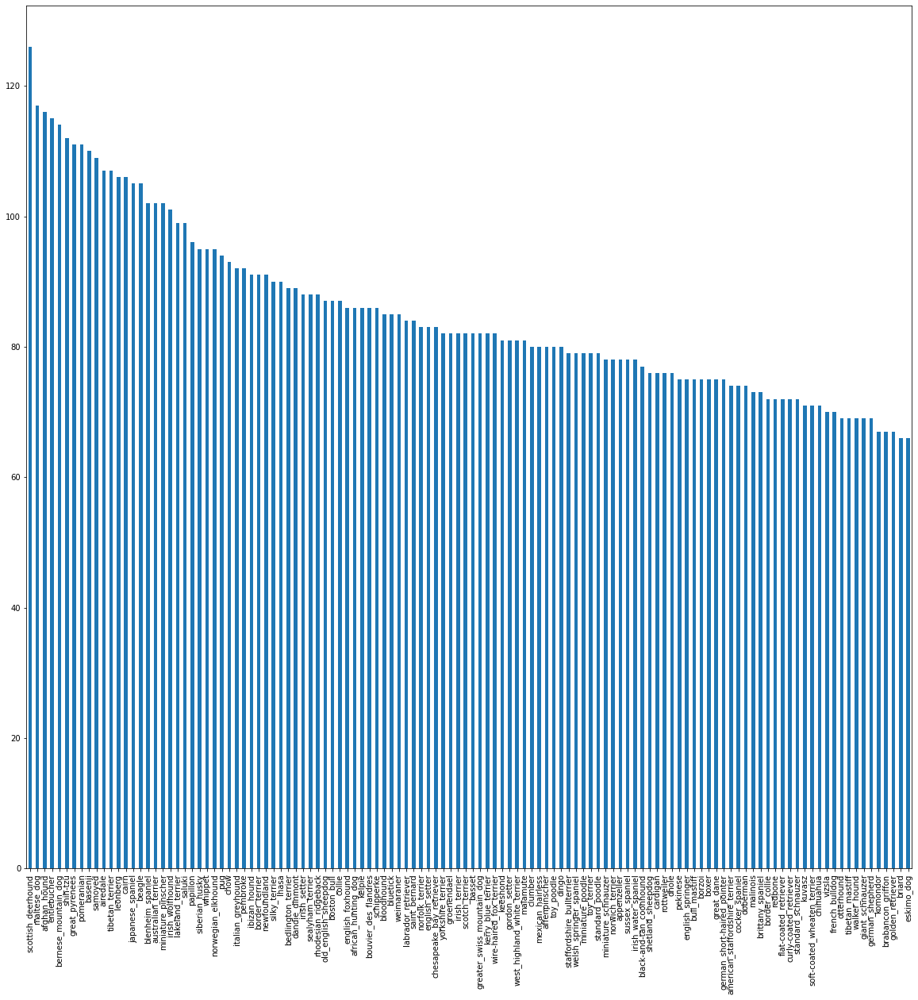

In [9]:
df['breed'].value_counts().plot.bar(figsize=(20,20))

In [10]:
df['breed'].value_counts().median()

82.0

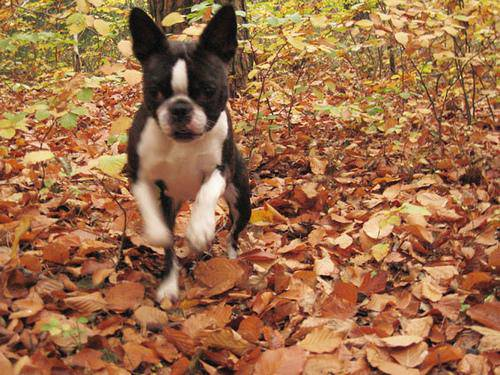

In [11]:
# View an image
from IPython.display import Image
Image('./drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg')

In [12]:
# Getting the images and labels

filenames= ["./drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/train/" + fname + ".jpg" for fname in df['id']]

filenames[:10]

['./drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 './drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 './drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 './drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 './drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 './drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 './drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 './drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 './drive/MyDrive/Dog-breed-identification-data/dog-bree

In [13]:
import os
os.listdir('./drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/train/')[:10]

['e07e46622e95d95ed698113415aaeda6.jpg',
 'e58763e5a8e37bcede344260eb20f26d.jpg',
 'de41f775f1b52a040d0965e0923bc983.jpg',
 'e297c765ac7e6c1d7c4657c7e72b1544.jpg',
 'e47a26a0b4510b25250f654577207ed3.jpg',
 'e93489f9d52d63c373264b27daabf420.jpg',
 'e5ec89512b1aa4594fffa72867874a27.jpg',
 'e00130d97b9b4073e79e0aed53fedc3c.jpg',
 'e1be68b2576ddfceabb23d33ee9e07ef.jpg',
 'e5fe6ce882c440a45354722376fdb770.jpg']

In [14]:
import os
if len(os.listdir('./drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/train/')) == len(filenames):
  print('The amount of files match!!')
else:
  print('The amount of file do not match') 

The amount of files match!!


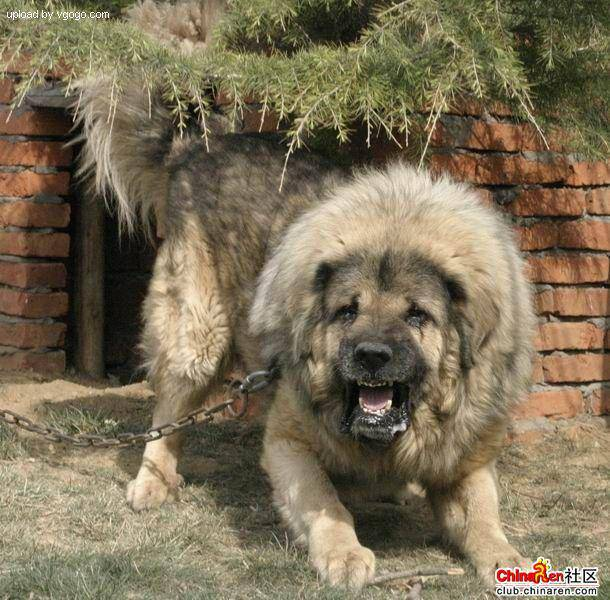

In [15]:
Image(filenames[9000])

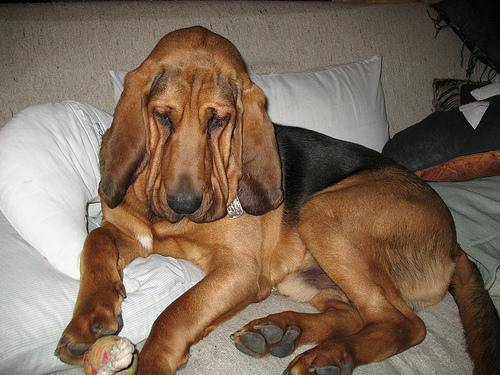

In [16]:
Image(filenames[69])

In [17]:
df['breed'][9000]

'tibetan_mastiff'

In [18]:
df['breed'][69]

'bloodhound'

In [19]:
labels= df['breed']
labels

0                     boston_bull
1                           dingo
2                        pekinese
3                        bluetick
4                golden_retriever
                   ...           
10217                      borzoi
10218              dandie_dinmont
10219                    airedale
10220          miniature_pinscher
10221    chesapeake_bay_retriever
Name: breed, Length: 10222, dtype: object

## Getting the labels

In [20]:
import numpy as np

# labels= np.array(labels) Does the same thing as below
labels= df['breed'].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [21]:
len(labels)

10222

In [22]:
# Checking to see if the number of labels matches the number of filenames

if len(labels) == len(filenames):
  print("The number of labels and filenames match")
else:
  print("The number of labels and filenames do not match")

The number of labels and filenames match


In [23]:
unique_breeds=np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [24]:
len(unique_breeds)

120

In [25]:
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [26]:
print(labels[2])
labels[5] == unique_breeds

pekinese


array([False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [27]:
# Turning every label into a boolean array

boolean_arrays= [label == unique_breeds for label in labels]
boolean_arrays[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [28]:
len(boolean_arrays)

10222

In [29]:
len(labels)

10222

In [30]:
# Turning the boolean array into integers

print(labels[0])
print(np.where(unique_breeds == labels[0]))
print(boolean_arrays[0].argmax())
print(boolean_arrays[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [31]:
boolean_arrays[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

## Creating our own validation set

> Since the dataset provided by kaggle has only train and test set, so we are creating a validation set to validate the experiments we had done while training the model on the training set.

In [32]:
X= filenames
y= boolean_arrays

In [33]:
# This is a google colab feature.
NUM_IMAGES=1000 #@param {type:'slider', min:1000, max: 10000, step: 1000}

In [34]:
# Splitting the training set into  training and validation set

from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val= train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES],test_size=0.2)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [35]:
X_train[:2], X_val[:2], y_train[:2], y_val[:2]

(['./drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/train/182c9134e07c883dfdc2acfb21184810.jpg',
  './drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/train/0685bcc6cdaa954771379d95d339baf6.jpg'],
 ['./drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/train/055429c6fb404af27ac52a08216e6cda.jpg',
  './drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/train/1383bc8b2db4943fafe13b7f289f4a03.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False,  True, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, Fa

## Preprocessing Images(Turning them into tensors)

> To preprocess the images into tensors

* Take the filepath of the image as an input
* Use Tensorflow to read the file and save it to a variable, `image`
* Turn the `image` into tensors
* Normalizing the RGB values, 0-255 to 0-1 values
* Resizing the `image` to be in a standard shape for easier processing(224,224)
* Now, returhn the modified image

In [36]:
IMG_SIZE= 224
def process_image(image_path,img_size=IMG_SIZE):
  """
    Taking the filepath of an image and converting it into a tensor.
  """

  # Reading the filepath
  image= tf.io.read_file(image_path)
  # Turning the image into tensors
  image=tf.image.decode_jpeg(image, channels=3)
  # Normalizing the RGB values, 0-255 to 0-1 values
  image= tf.image.convert_image_dtype(image, tf.float32)
  # Resizing the images to a standard size for easier processing
  image=tf.image.resize(image,size=[img_size,img_size])

  # Returning the modified image

  return image

In [37]:
tensor=tf.io.read_file(filenames[21])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01@\x01\x86\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [38]:
tensor=tf.image.decode_jpeg(tensor, channels=3) 
tensor

<tf.Tensor: shape=(320, 390, 3), dtype=uint8, numpy=
array([[[ 83,  99,  88],
        [ 85, 101,  90],
        [ 85, 101,  90],
        ...,
        [ 40,  39,  44],
        [ 40,  39,  44],
        [ 40,  39,  44]],

       [[ 78,  94,  83],
        [ 81,  97,  86],
        [ 82,  98,  87],
        ...,
        [ 40,  39,  44],
        [ 40,  39,  44],
        [ 40,  39,  44]],

       [[ 71,  87,  76],
        [ 74,  90,  79],
        [ 77,  93,  82],
        ...,
        [ 40,  39,  44],
        [ 40,  39,  44],
        [ 40,  39,  44]],

       ...,

       [[ 29,  80,  49],
        [ 37,  88,  57],
        [ 47,  98,  67],
        ...,
        [116, 168, 120],
        [117, 166, 119],
        [108, 160, 112]],

       [[ 39,  90,  59],
        [ 43,  94,  63],
        [ 48,  99,  68],
        ...,
        [115, 169, 119],
        [118, 170, 121],
        [110, 164, 114]],

       [[ 50, 101,  70],
        [ 49, 100,  69],
        [ 46,  97,  66],
        ...,
        [117, 171, 12

In [39]:
tensor=tf.image.convert_image_dtype(tensor, tf.float32)
tensor

<tf.Tensor: shape=(320, 390, 3), dtype=float32, numpy=
array([[[0.3254902 , 0.38823533, 0.34509805],
        [0.33333334, 0.39607847, 0.3529412 ],
        [0.33333334, 0.39607847, 0.3529412 ],
        ...,
        [0.15686275, 0.15294118, 0.17254902],
        [0.15686275, 0.15294118, 0.17254902],
        [0.15686275, 0.15294118, 0.17254902]],

       [[0.30588236, 0.36862746, 0.3254902 ],
        [0.31764707, 0.3803922 , 0.3372549 ],
        [0.32156864, 0.38431376, 0.34117648],
        ...,
        [0.15686275, 0.15294118, 0.17254902],
        [0.15686275, 0.15294118, 0.17254902],
        [0.15686275, 0.15294118, 0.17254902]],

       [[0.2784314 , 0.34117648, 0.29803923],
        [0.2901961 , 0.3529412 , 0.30980393],
        [0.3019608 , 0.3647059 , 0.32156864],
        ...,
        [0.15686275, 0.15294118, 0.17254902],
        [0.15686275, 0.15294118, 0.17254902],
        [0.15686275, 0.15294118, 0.17254902]],

       ...,

       [[0.1137255 , 0.3137255 , 0.19215688],
        [0.14

In [40]:
from matplotlib.pyplot import imread
image= imread(filenames[69])
image

array([[[  4,   3,   0],
        [  7,   6,   2],
        [  9,   8,   4],
        ...,
        [  6,   6,   6],
        [  6,   6,   6],
        [  6,   6,   6]],

       [[  4,   3,   0],
        [  3,   2,   0],
        [  1,   0,   0],
        ...,
        [  5,   5,   5],
        [  5,   5,   5],
        [  5,   5,   5]],

       [[  7,   6,   2],
        [  3,   2,   0],
        [  1,   0,   0],
        ...,
        [  4,   4,   4],
        [  4,   4,   4],
        [  4,   4,   4]],

       ...,

       [[118, 118, 116],
        [117, 117, 115],
        [116, 116, 114],
        ...,
        [ 16,  15,  11],
        [ 14,  13,   9],
        [ 12,  11,   7]],

       [[111, 111, 109],
        [111, 111, 109],
        [112, 112, 110],
        ...,
        [ 15,  14,  10],
        [ 14,  13,   9],
        [ 13,  12,   8]],

       [[107, 107, 105],
        [108, 108, 106],
        [110, 110, 108],
        ...,
        [ 14,  13,   9],
        [ 15,  14,  10],
        [ 16,  15,  11]]

In [41]:
image.shape

(375, 500, 3)

In [42]:
#Turning an image into tensor
tf.constant(image)[:2] # This is a tensor and it is on tensorflow, so it's able to run on a GPU. So, it will compute faster.

<tf.Tensor: shape=(2, 500, 3), dtype=uint8, numpy=
array([[[4, 3, 0],
        [7, 6, 2],
        [9, 8, 4],
        ...,
        [6, 6, 6],
        [6, 6, 6],
        [6, 6, 6]],

       [[4, 3, 0],
        [3, 2, 0],
        [1, 0, 0],
        ...,
        [5, 5, 5],
        [5, 5, 5],
        [5, 5, 5]]], dtype=uint8)>

In [43]:
image[:2]

array([[[4, 3, 0],
        [7, 6, 2],
        [9, 8, 4],
        ...,
        [6, 6, 6],
        [6, 6, 6],
        [6, 6, 6]],

       [[4, 3, 0],
        [3, 2, 0],
        [1, 0, 0],
        ...,
        [5, 5, 5],
        [5, 5, 5],
        [5, 5, 5]]], dtype=uint8)

## Turning the data into batches

> Why should we? If we pass all of the 10,000+ images at once, the the GPU can run out of memory and the process will break. That's why we are using 32(batch size) images at once(we can manually change the batch size if need be).

> In order to use Tensorflow effectively, we need the data in the form of Tensor tuples`(image, label)`.

In [44]:
# Creating a function to return a tuple(image, label)

def get_image_label(image_path, label):
  """
    Taking the filepath of the image and the label assosciated with it, 
    processing the image and returning a tuple(image, label)  
  """
  image= process_image(image_path)
  return image, label   # Tuple format

In [45]:
(process_image(X[96]), y[96]) # Tupel(image,label)

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.14717263, 0.11187851, 0.13148636],
         [0.13084297, 0.10731356, 0.12299983],
         [0.08096989, 0.05744048, 0.07312676],
         ...,
         [0.18951757, 0.1263524 , 0.13041398],
         [0.19663884, 0.12212902, 0.12997216],
         [0.20413171, 0.12606797, 0.1339111 ]],
 
        [[0.12703082, 0.09394258, 0.11575631],
         [0.12597603, 0.10134367, 0.12033877],
         [0.10243786, 0.0799326 , 0.09786415],
         ...,
         [0.19590753, 0.1328605 , 0.13688271],
         [0.20990483, 0.13870385, 0.14544405],
         [0.16468829, 0.09348731, 0.10022751]],
 
        [[0.15005253, 0.12260155, 0.15005253],
         [0.14729518, 0.1198442 , 0.14729518],
         [0.14196429, 0.12207634, 0.1457458 ],
         ...,
         [0.20299768, 0.14025258, 0.14417414],
         [0.24966297, 0.18691786, 0.19083942],
         [0.21788771, 0.15737477, 0.16018027]],
 
        ...,
 
        [[0.43277314, 0.4075018 

## Turning all of the data into batches

In [46]:
BATCH_SIZE=32 # Recommended by most ML expersts.

# Function to turn all of the data(X and y) into batches

def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
    Creates batches of data out of image(X) and label(y) pairs. Shuffles the data
    if it's training data(since we dont want the model to learn the ordering of 
    the images in the dataset and be as adaptable as possible) but doesn't 
    shuffle if it's validation data. Also accepts the test dataset as 
    input(no labels).
  """

  #If the data is a test dataset, we probably don't have labels

  if test_data:

    print("Creating test data batches..")

    # Creates a dataset, whose elements are slices of the given tensors. When we pass some tensors to the function(from_tensor_slices()), then it will create a dataset out of it. Link -> "https://www.tensorflow.org/api_docs/python/tf/data/Dataset"
    
    data= tf.data.Dataset.from_tensor_slices((tf.constant(X))) # Only filepaths(no labels)
    
    data_batch= data.map(process_image).batch(BATCH_SIZE) # Processing the images as well as creating batches(32) of the images at the same time.
    
    return data_batch

    # If the data is a valid dataset, we don't need to shuffle it

  elif valid_data:

    print("Creating validation data batches..")

    data= tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))   # 'tf.constant(X)' -> Turning the X dataset or imagepaths into a tensor.

    data_batch= data.map(get_image_label).batch(BATCH_SIZE) # we are using the 'get_image_tuple' because we have both the images and labels here unlike in test dataset there is no labels. We are processing the images and returning the (image, lable) as a tuple.

    return data_batch

  
  # Creating the Training dataset.

  else:

    print('Creating training data batches...')

    # Turn filepaths and labels into Tensors
    data= tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))

    # Shuffeling the pathnames and labels since it is faster than shuffeling images. Shuffle the data when it is at it's smallest format, in here, filenames rather than full images.
    data= data.shuffle(buffer_size=len(X)) # 'buffer_size' stands for how many variables we want to shuffle.

    # Creating the tuples(image,label) and preprocessing the images(turning the imagepaths into preprocessed images)
    data=data.map(get_image_label) 

    # Turning the data into batches
    data_batch= data.batch(BATCH_SIZE)
  
  return data_batch

     

In [47]:
train_data= create_data_batches(X_train,y_train)
valid_data= create_data_batches(X_val,y_val)

Creating training data batches...
Creating training data batches...


In [48]:
train_data.element_spec, valid_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing the data batches

> The dataset has been converted into batches, however it is hard to understand these batches, so to understand, we will try to visualize them.

In [49]:
import matplotlib.pyplot as plt

# Creating a function to view the images in the data batch

SIZE=25

def show_images(images, labels,length=SIZE):
  """
    Displaying a plot of images and their labels from the data batch
  """

  # Figure
  plt.figure(figsize=(20,20))

  # Displaying images
  for i in range(length):

    #Subplots
    ax=plt.subplot(5,5,i+1) # Rows, columns, index

    # Displaying an image

    plt.imshow(images[i])

    # Adding label to the image

    plt.title(unique_breeds[labels[i].argmax()])  # Since unique_breeds has all of the 120 dog breed names. 'labels' is the labels of the images here.

    #Turning the grid lines off
    plt.axis('off')

In [50]:
y[0]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [51]:
y[0].argmax()

19

In [52]:
unique_breeds[y[0].argmax()]

'boston_bull'

In [53]:
image.shape

(375, 500, 3)

In [54]:
image[:2]


array([[[4, 3, 0],
        [7, 6, 2],
        [9, 8, 4],
        ...,
        [6, 6, 6],
        [6, 6, 6],
        [6, 6, 6]],

       [[4, 3, 0],
        [3, 2, 0],
        [1, 0, 0],
        ...,
        [5, 5, 5],
        [5, 5, 5],
        [5, 5, 5]]], dtype=uint8)

In [55]:
train_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [56]:
train_images, train_labels=next(train_data.as_numpy_iterator()) # Iterating over the BatchDataset we have created. Returns an iterator which converts all elements of the dataset to numpy.

In [57]:
train_images[:2]

array([[[[0.36339918, 0.22222269, 0.16732071],
         [0.35750037, 0.19567303, 0.17295769],
         [0.32962185, 0.1492297 , 0.1588323 ],
         ...,
         [0.20414402, 0.17141528, 0.20454708],
         [0.04004429, 0.01989407, 0.04373705],
         [0.21249698, 0.19288914, 0.21641855]],

        [[0.3559699 , 0.21479343, 0.15989146],
         [0.35270947, 0.1911111 , 0.16839576],
         [0.33293068, 0.15539025, 0.16397935],
         ...,
         [0.18254533, 0.1498166 , 0.1845977 ],
         [0.05506298, 0.03491276, 0.06069567],
         [0.20695865, 0.18735081, 0.21271846]],

        [[0.35082284, 0.20542008, 0.15263125],
         [0.34791857, 0.1863202 , 0.16360486],
         [0.33599442, 0.16168593, 0.1691264 ],
         ...,
         [0.215918  , 0.18149996, 0.2232182 ],
         [0.0719538 , 0.05201545, 0.08016135],
         [0.08913144, 0.0695236 , 0.09697457]],

        ...,

        [[0.3510942 , 0.39423147, 0.36529237],
         [0.3396758 , 0.38619193, 0.33940443]

In [58]:
train_labels[:2]

array([[False, False, False, False, False, False, False, False, False,
        False, False, False, False,  True, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False],
       [False, False, False, False, False, Fals

In [59]:
len(train_images), len(train_labels) # Since the batch_size is 32.

(32, 32)

In [60]:
# Visualizing the data in the training batch

show_images(train_images,train_labels)

Output hidden; open in https://colab.research.google.com to view.

# Visualizing the data in the training batch

In [61]:
# The images will be random as we have shuffled the training set everytime we create a training batch.
train_images, train_labels=next(train_data.as_numpy_iterator())
show_images(train_images,train_labels)

Output hidden; open in https://colab.research.google.com to view.

(-0.5, 223.5, 223.5, -0.5)

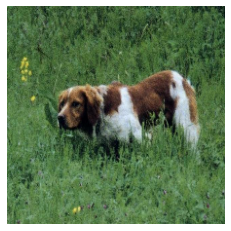

In [62]:
plt.imshow(train_images[0])
plt.axis('off')

In [63]:
valid_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

# Visualizing the validation batch



In [64]:
valid_images, valid_labels= next(valid_data.as_numpy_iterator()) # The images will remain same as we haven't shuffled the validation set everytime we create a validation batch.
show_images(valid_images,valid_labels)

Output hidden; open in https://colab.research.google.com to view.

# Building a model

> Few things we need before starting to build a model.

* The input shape(the images shape, in the form of Tensors) to the model
* The output shape(the output label(prediction based on the image), in the form of Tensors) to the model.
* The URL of the model(As we are using a previously trained model from Tensorflow hub). 

Link -> https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [65]:
IMG_SIZE

224

In [66]:
len(unique_breeds)

120

In [67]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [68]:
# Input shape

INPUT_SHAPE= [None, IMG_SIZE, IMG_SIZE, 3]

# Output shape

OUTPUT_SHAPE= len(unique_breeds)

# Model link
MODEL_URL='https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5' 

### Steps to create a model 

* Taking the input, output shape and the URL of the model(parameters)
* Defining the layers of the model in keras using the sequential model (keras.Sequential)
* Compiling the model
* Building the model
* Returning the model

Link -> https://www.tensorflow.org/guide/keras/sequential_model


In [69]:
# Creating the funtion to build a model suing keras

def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building the model: ", model_url)
  """
    Creating a model using Tensorflow Keras Sequential model with the model we had imported from TensorFlow Hub.
  """
  # Layers(Defining the model)

  model=tf.keras.Sequential([hub.KerasLayer(MODEL_URL), # Input layer
                             tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation='softmax')]) # Output layer

  # Compiling the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), optimizer=tf.keras.optimizers.Adam(), metrics=['accuracy']
  )

  # Building the model
  model.build(INPUT_SHAPE)

  return model


In [70]:
model= create_model()
model.summary()

Building the model:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [71]:
len(df)

10222

# Creating callbacks

> They are helper functions which are used by a model during training to do various things such as saving the progress, checking the progress or stop the training early if the model is not improving(loss function is not decreasing sufficiently).

> We are creating two callbacks:

* Tensorboard -> Helps in tracking the progress of the model
* Early stopping the model training if the model is not improving or it is training for too long.

## TensorBoard callback

Steps needed to setup TensorBoard callback:

* Load the TensorBoard notebook extension
* Create a TensorBoard callback which is able to save the logs to a directory and pass it to the model's `fit()` function.
* Visualize the logs of the training model with the `%tensorboard` magic function(After model training)

In [72]:
# Load the Tensorboard notebook extension

%load_ext tensorboard

In [73]:
import datetime

# Function to build a TensorBoard callback

def create_tensorboard_callback():
  #Storing the logs in a 'logs' folder. Making it so that the logs get tracked whenever we run an experiment.
  logdir= os.path.join('./drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/logs',datetime.datetime.now().strftime('%Y%m%d-%H%M%S')) # '.join' for accessing path names to get access to the 'logs' folder. 'datetime' is storing the current datetime when running the experiment and it is stored in a particular format.


  return tf.keras.callbacks.TensorBoard(logdir)

## Early stopping callback

> Early stopping helps stop the model from overfitting by stopping training if a certain evaluation metric stops improving

Link -> https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [74]:
early_stopping=tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',patience=3) # 'val_accuracy' -> validation accuracy
early_stopping

## Training the model on a subset of the data

> We will try to train the model on 1000 images to see if everything is working properly.

In [75]:
# Checking if a GPU is available
print('GPU', 'available' if tf.config.list_physical_devices("GPU") else 'not available')

GPU available


In [76]:
# Google Colab feature
NUM_EPOCHS= 100 #@param {type:'slider', min:10, max:100, steps:10}

### Training the model

* Create a model using `create_model()`
* Setup a tensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on the model by passing the training data, validation data and the number of epochs(`NUM_EPOCHS`) to train the model for and the callback functions we have created above.
* Finally, return the model

In [77]:
# Function to train the model

def train_model():
  """
    Trains the given model and returns the trained model.
  """
  #create a model
  model= create_model()

  # Create the tensorBoard Callback
  tensorboard= create_tensorboard_callback()

  # Fitting the model
  model.fit(x=train_data, epochs=NUM_EPOCHS, validation_data=valid_data, validation_freq=1, callbacks=[tensorboard, early_stopping])

  # Returning model
  return model

In [78]:
# Fit the model with the data

model= train_model() 
# Training for 25 steps. Since we started with '1000' images and '0.2 or 20%' of the images are validation set, therefore there are 800 images on the training set. Hence 800/32=25, '32' is the 'batch_size'. This is how we are getting 25 steps in each epoch.
# Validation has 7 steps. Since we started with '1000' images and '0.2 or 20%' of the images are validation set(200), therefore there are 200 images on the validation set. Hence 200/32=6.25(rounded to 7),. This is how we are getting 7 steps in each epoch.

Building the model:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 129s 231ms/step - loss: 4.6301 - accuracy: 0.0950 - val_loss: 3.4925 - val_accuracy: 0.2700
Epoch 2/100
25/25 [==============================] - 5s 195ms/step - loss: 1.6776 - accuracy: 0.6825 - val_loss: 2.2336 - val_accuracy: 0.5150
Epoch 3/100
25/25 [==============================] - 5s 202ms/step - loss: 0.5841 - accuracy: 0.9300 - val_loss: 1.7200 - val_accuracy: 0.6000
Epoch 4/100
25/25 [==============================] - 5s 194ms/step - loss: 0.2522 - accuracy: 0.9875 - val_loss: 1.5609 - val_accuracy: 0.6300
Epoch 5/100
25/25 [==============================] - 5s 207ms/step - loss: 0.1476 - accuracy: 0.9975 - val_loss: 1.5015 - val_accuracy: 0.6600
Epoch 6/100
25/25 [==============================] - 5s 206ms/step - loss: 0.0996 - accuracy: 1.0000 - val_loss: 1.4527 - val_accuracy: 0.6550
Epoch 7/100
25/25 [============================

> The model is overfitting because it is performing way better on the training dataset than on the validation dataset. We have to prevent pverfitting of the model.

## Checking the TensorBoard logs

> Using the TensorBoard magic function(%tensorboard)

In [79]:
%tensorboard --logdir /content/drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/logs

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluation predictions using a trained model

> It is not performed on the training dataset. It is performed on the validation dataset

In [80]:
valid_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [81]:
predictions= model.predict(valid_data, verbose=1)
predictions

7/7 [==============================] - 2s 160ms/step


array([[8.3369741e-06, 3.5732301e-04, 1.4841647e-04, ..., 1.4540544e-04,
        1.3878099e-02, 1.9792091e-05],
       [9.3479412e-06, 3.5487665e-05, 9.3534600e-06, ..., 1.4628999e-06,
        2.3597280e-04, 1.4431746e-04],
       [2.4446999e-04, 2.2785286e-04, 2.2518497e-04, ..., 7.1695780e-05,
        4.3743220e-03, 1.8335287e-02],
       ...,
       [7.5652110e-07, 4.1284882e-03, 9.3690496e-06, ..., 9.0101839e-04,
        1.3446114e-05, 6.3821881e-06],
       [2.8227887e-06, 5.5374014e-05, 1.1488987e-05, ..., 2.4224082e-05,
        7.9507472e-06, 5.0646895e-07],
       [3.6275110e-04, 5.5939337e-04, 1.3590946e-04, ..., 3.2900596e-05,
        1.0192281e-04, 2.2535031e-03]], dtype=float32)

In [82]:
predictions.shape

(200, 120)

In [83]:
len(y_val)

200

In [84]:
len(unique_breeds)

120

In [85]:
predictions[0]

array([8.3369741e-06, 3.5732301e-04, 1.4841647e-04, 8.0016834e-01,
       3.1699843e-04, 2.6943517e-04, 4.8940437e-04, 2.1157932e-05,
       1.0622782e-04, 3.1102576e-05, 2.0436948e-04, 2.6334095e-04,
       1.7640936e-04, 1.3805299e-04, 7.9869911e-05, 1.7191231e-04,
       3.0385880e-04, 1.7510899e-04, 6.5190287e-04, 1.5514470e-05,
       2.2165023e-04, 4.6103625e-04, 7.8333454e-05, 8.6261320e-04,
       2.5137255e-04, 2.5480647e-05, 1.1946732e-05, 1.0958375e-04,
       1.9781515e-03, 1.4387644e-05, 1.7498487e-05, 5.9851413e-05,
       2.9385791e-04, 1.1981241e-03, 9.1420917e-04, 8.9799556e-05,
       1.0663961e-03, 1.9012143e-04, 2.6360806e-03, 1.2834555e-03,
       1.4037579e-04, 1.7376516e-04, 8.5874839e-05, 1.0677688e-04,
       1.7435919e-05, 1.5697678e-05, 7.0733360e-05, 1.4961277e-04,
       1.2486228e-03, 4.2062483e-04, 5.8136781e-04, 1.6146278e-04,
       3.9966901e-05, 2.6120941e-04, 6.4578926e-05, 1.1233223e-04,
       4.3787621e-04, 1.1576565e-01, 2.8730239e-04, 1.1851604e

In [86]:
len(predictions[0])

120

In [87]:
predictions[0].argmax()

3

In [88]:
np.sum((predictions[0]))

1.0000001

In [89]:
# Prediction
index=69
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[4.22589626e-04 1.02523959e-03 1.13646514e-04 1.61833566e-04
 1.58458042e-05 8.46596522e-05 3.25562942e-05 2.96568669e-05
 2.82993769e-05 6.28088601e-05 1.06856969e-04 2.70485471e-04
 6.45608889e-05 1.04188977e-04 2.27123033e-04 3.51204188e-04
 2.36230524e-04 2.12169066e-02 8.09264602e-05 3.60526210e-05
 5.65950293e-03 9.90854576e-04 3.57846147e-04 1.11554684e-02
 5.93116674e-05 5.87028591e-03 9.05953173e-04 1.62148935e-05
 1.11554447e-03 1.29359032e-05 9.32231953e-04 1.53771631e-04
 5.96154605e-05 3.34834003e-05 1.20991135e-05 1.85495046e-05
 5.93199293e-05 3.11693584e-05 1.11953414e-04 3.62558581e-04
 1.08278677e-04 4.32115230e-05 1.94706896e-04 9.53860173e-04
 8.71569937e-05 7.64309152e-05 2.37968881e-02 6.33099917e-05
 7.86001969e-04 8.08345212e-05 8.69284631e-05 1.38860691e-04
 1.37352850e-03 6.01956199e-05 7.43387965e-04 1.58819148e-05
 1.96546418e-04 3.17919112e-05 3.23706627e-05 1.79125549e-04
 5.87062677e-05 1.18491575e-04 2.66407933e-02 6.63247047e-05
 7.15674905e-05 1.756654

In [90]:
# Prediction
index=1
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[9.34794116e-06 3.54876647e-05 9.35345997e-06 2.04362859e-05
 1.04100240e-04 2.17187826e-05 6.13675866e-06 9.85130391e-05
 9.85282779e-01 3.23704467e-03 3.79910807e-06 1.62020879e-05
 1.67656253e-04 3.95883369e-04 1.05036504e-03 3.04015353e-04
 7.80619939e-06 5.06931501e-05 4.45552505e-05 4.96744105e-05
 3.25024075e-06 3.48145841e-04 7.93240542e-06 6.63139463e-06
 2.80595530e-04 6.40992266e-06 2.40261543e-05 9.81587436e-05
 1.60109157e-05 4.30871012e-07 5.93415716e-05 7.21624092e-05
 6.13312877e-05 9.15208420e-06 5.71771579e-06 1.55824782e-05
 7.37365044e-05 6.23374353e-06 8.05757554e-06 2.79290311e-04
 2.05631964e-04 1.99777915e-05 2.60848683e-05 1.67380604e-05
 3.24101370e-06 1.80653149e-06 1.22025403e-05 6.21364889e-05
 1.19382075e-05 2.38938756e-05 1.56006587e-04 9.37078657e-05
 1.96197038e-06 4.02843638e-04 3.44777186e-06 5.96707760e-05
 1.21780331e-05 2.43166924e-05 1.44688765e-05 2.86725954e-05
 2.52625578e-05 5.36513071e-05 5.67122072e-07 1.20870318e-05
 3.88611670e-06 4.324048

In [91]:
# Prediction probabilities are also known as confidence levels.
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label


'airedale'

In [92]:
valid_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

>Since our validation data (val_data) is in batch form, to get a list of validation images and labels, we'll have to unbatch it `(using unbatch())` and then turn it into an iterator using `as_numpy_iterator()`

In [93]:
_images=[]
_labels=[]

for image, label in valid_data.unbatch().as_numpy_iterator():
  # print(image)
  # print(label)
  _images.append(image)
  _labels.append(label)

In [94]:
_images

[array([[[0.59180677, 0.58396363, 0.6271009 ],
         [0.54908746, 0.5412443 , 0.5843816 ],
         [0.5546547 , 0.5468116 , 0.58994883],
         ...,
         [0.9843138 , 1.        , 0.9803922 ],
         [0.9843138 , 1.        , 0.9803922 ],
         [0.9843138 , 1.        , 0.9803922 ]],
 
        [[0.5951156 , 0.58727247, 0.6304097 ],
         [0.5520549 , 0.54421175, 0.587349  ],
         [0.5542017 , 0.5463586 , 0.58949584],
         ...,
         [0.99093145, 1.        , 0.9803922 ],
         [0.99093145, 1.        , 0.9803922 ],
         [0.99093145, 1.        , 0.9803922 ]],
 
        [[0.5941352 , 0.5862921 , 0.62942934],
         [0.5506478 , 0.54280466, 0.5859419 ],
         [0.55223435, 0.5443912 , 0.58752847],
         ...,
         [0.99375004, 1.        , 0.9803922 ],
         [0.99375004, 1.        , 0.9803922 ],
         [0.99375004, 1.        , 0.9803922 ]],
 
        ...,
 
        [[0.39061627, 0.40630254, 0.45336136],
         [0.35343137, 0.36911768, 0.41617

In [95]:
_labels

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False,  True, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [96]:
get_pred_label(_labels[0])

'miniature_schnauzer'

In [97]:
get_pred_label(predictions[0]) # Prediction the model got wrong

'airedale'

## Creating a function to unbatch the batched dataset

In [98]:
def unbatchify(data):
  """
    Takes a batched dataset of (image, label) Tensors and returns  separate arrays of images and labels
  """

  images=[]
  labels=[]

  # Loop through unbatched data

  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images,labels

  # Testing the above function

val_images, val_labels= unbatchify(valid_data)

In [99]:
val_images[0], val_labels[0]

(array([[[0.405488  , 0.43686056, 0.44862527],
         [0.4172665 , 0.44863904, 0.45928258],
         [0.38140875, 0.414312  , 0.41756305],
         ...,
         [0.36344787, 0.4756427 , 0.6283312 ],
         [0.31310472, 0.4337091 , 0.5838061 ],
         [0.32464188, 0.44585994, 0.59727865]],
 
        [[0.3668351 , 0.38644296, 0.39820766],
         [0.44881648, 0.46846145, 0.4801148 ],
         [0.46623057, 0.48975998, 0.48975295],
         ...,
         [0.50174904, 0.6075946 , 0.7250123 ],
         [0.36082146, 0.45864186, 0.5800354 ],
         [0.3577394 , 0.450701  , 0.57928836]],
 
        [[0.24816467, 0.27045983, 0.27416256],
         [0.26265913, 0.2860012 , 0.28656322],
         [0.19687214, 0.22040156, 0.21482855],
         ...,
         [0.36256686, 0.46247053, 0.5461278 ],
         [0.3376453 , 0.40491948, 0.5000525 ],
         [0.3305758 , 0.3883228 , 0.48587176]],
 
        ...,
 
        [[0.5819284 , 0.5780068 , 0.56232053],
         [0.5657902 , 0.5618686 , 0.54618

In [100]:
valid_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [101]:
get_pred_label(val_labels[0])

'affenpinscher'


Now we've got ways to get:

   * Prediction labels
   * Validation labels (truth labels)
   * Validation images

Let's make some functions to make these all a bit more visualize.

More specifically, we want to be able to view an image, its predicted label and its actual label (true label).

The first function we'll create will:

  * Take an array of prediction probabilities, an array of truth labels, an array of images and an integer.
  * Convert the prediction probabilities to a predicted label.
  * Plot the predicted label, its predicted probability, the truth label and target image on a single plot.


In [102]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
    View the prediction, ground truth and image for sample n
  """

  pred_prob, true_label, image= prediction_probabilities[n], labels[n], images[n]

  # pred_label
  pred_label=get_pred_label(pred_prob)

  # Plot the image
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong

  if pred_label == true_label:
    color= "green"
  else:
    color="red"

  plt.title("{} {:2.0f}% ({})".format(pred_label, np.max(pred_prob)*100,true_label), color=color)

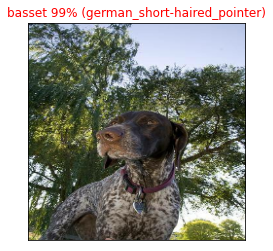

In [103]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images)

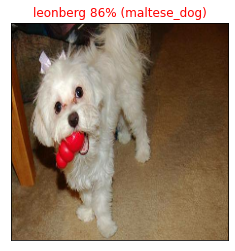

In [104]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images,n=69)

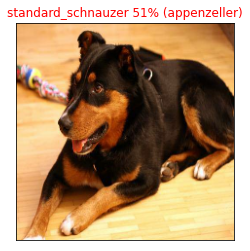

In [105]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images,n=2)

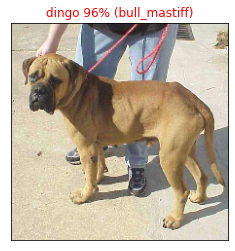

In [106]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images,n=30)

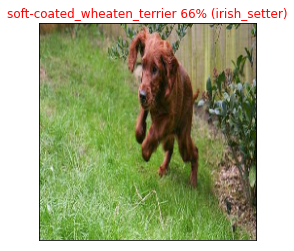

In [107]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images,n=31)

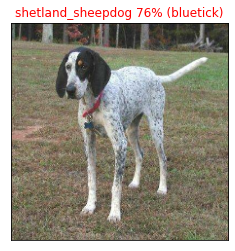

In [108]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images,n=7)

Since we're working with a multi-class problem (120 different dog breeds), it would also be good to see what other guesses our model is making. More specifically, if our model predicts a certain label with 24% probability, what else did it predict?

Let's build a function to demonstrate. The function will:

* Take an input of a prediction probabilities array, a ground truth labels array and an integer.
* Find the predicted label using get_pred_label().
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green.


In [109]:
predictions[0]

array([8.3369741e-06, 3.5732301e-04, 1.4841647e-04, 8.0016834e-01,
       3.1699843e-04, 2.6943517e-04, 4.8940437e-04, 2.1157932e-05,
       1.0622782e-04, 3.1102576e-05, 2.0436948e-04, 2.6334095e-04,
       1.7640936e-04, 1.3805299e-04, 7.9869911e-05, 1.7191231e-04,
       3.0385880e-04, 1.7510899e-04, 6.5190287e-04, 1.5514470e-05,
       2.2165023e-04, 4.6103625e-04, 7.8333454e-05, 8.6261320e-04,
       2.5137255e-04, 2.5480647e-05, 1.1946732e-05, 1.0958375e-04,
       1.9781515e-03, 1.4387644e-05, 1.7498487e-05, 5.9851413e-05,
       2.9385791e-04, 1.1981241e-03, 9.1420917e-04, 8.9799556e-05,
       1.0663961e-03, 1.9012143e-04, 2.6360806e-03, 1.2834555e-03,
       1.4037579e-04, 1.7376516e-04, 8.5874839e-05, 1.0677688e-04,
       1.7435919e-05, 1.5697678e-05, 7.0733360e-05, 1.4961277e-04,
       1.2486228e-03, 4.2062483e-04, 5.8136781e-04, 1.6146278e-04,
       3.9966901e-05, 2.6120941e-04, 6.4578926e-05, 1.1233223e-04,
       4.3787621e-04, 1.1576565e-01, 2.8730239e-04, 1.1851604e

In [110]:
predictions[0][predictions[0].argsort()[-10:][::-1]] # Get the last 10 values and sort then in reverse order(descending order).

array([0.80016834, 0.11576565, 0.0138781 , 0.01318355, 0.01095223,
       0.00593363, 0.0043758 , 0.00263608, 0.00257194, 0.00197815],
      dtype=float32)

In [111]:
predictions[0].max()

0.80016834

In [112]:
[predictions[0].argsort()[-10:][::-1]] # This are the top 10 indexes of predictions for prediction[0]

[array([  3,  57, 118,  83,  68,  90, 106,  38,  75,  28])]

In [113]:
[predictions[0].argsort()[-10:]] # Ascending order

[array([ 28,  75,  38, 106,  90,  68,  83, 118,  57,   3])]

In [114]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
    Plots the top 10 highest prediction confidences along with
    the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes= pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values= pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels= unique_breeds[top_10_pred_indexes]

  # Setting up the plot

  top_plot= plt.bar(np.arange(len(top_10_pred_labels)),top_10_pred_values, color='grey')
  
  plt.xticks(np.arange(len(top_10_pred_labels)),labels=top_10_pred_labels, rotation='vertical')

   # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass


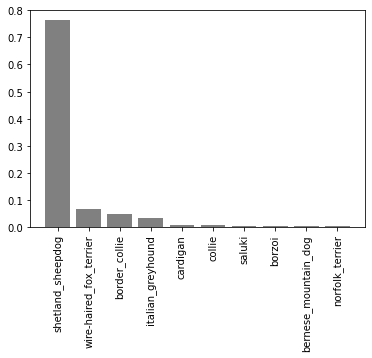

In [115]:
plot_pred_conf(prediction_probabilities=predictions,labels=val_labels,n=7)

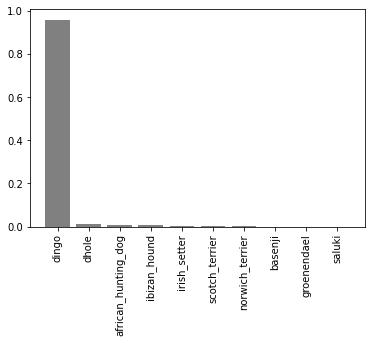

In [116]:
plot_pred_conf(prediction_probabilities=predictions,labels=val_labels,n=30)

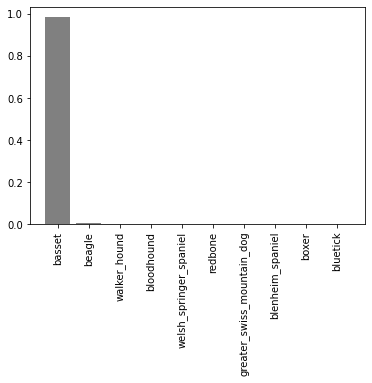

In [117]:
plot_pred_conf(prediction_probabilities=predictions,labels=val_labels,n=1)

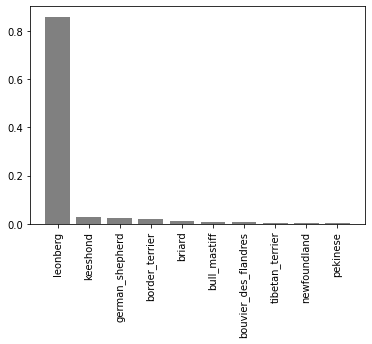

In [118]:
plot_pred_conf(prediction_probabilities=predictions,labels=val_labels,n=69)

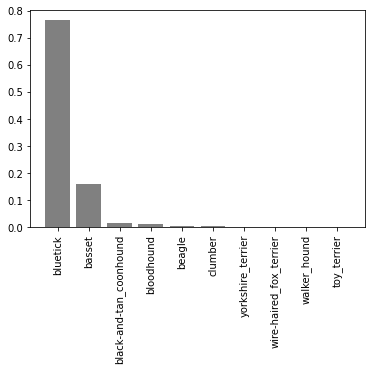

In [119]:
plot_pred_conf(prediction_probabilities=predictions,labels=val_labels,n=8)

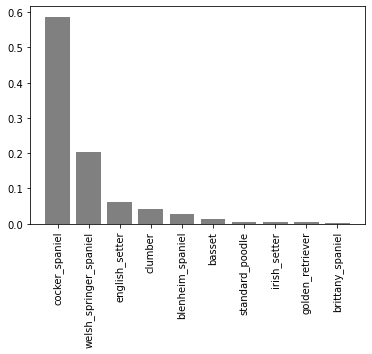

In [120]:
plot_pred_conf(prediction_probabilities=predictions,labels=val_labels,n=9)

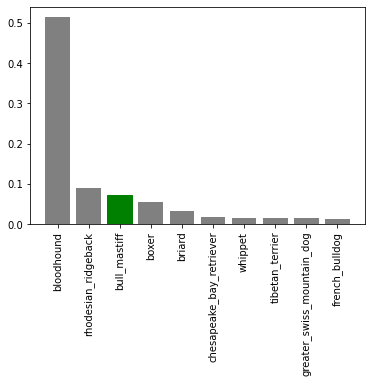

In [121]:
plot_pred_conf(prediction_probabilities=predictions,labels=val_labels,n=10)

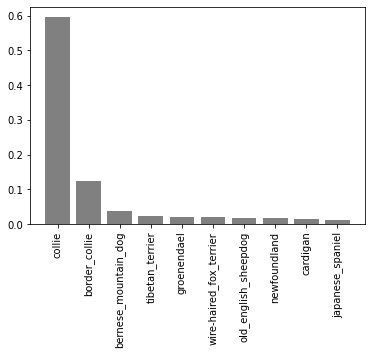

In [122]:
plot_pred_conf(prediction_probabilities=predictions,labels=val_labels,n=11)

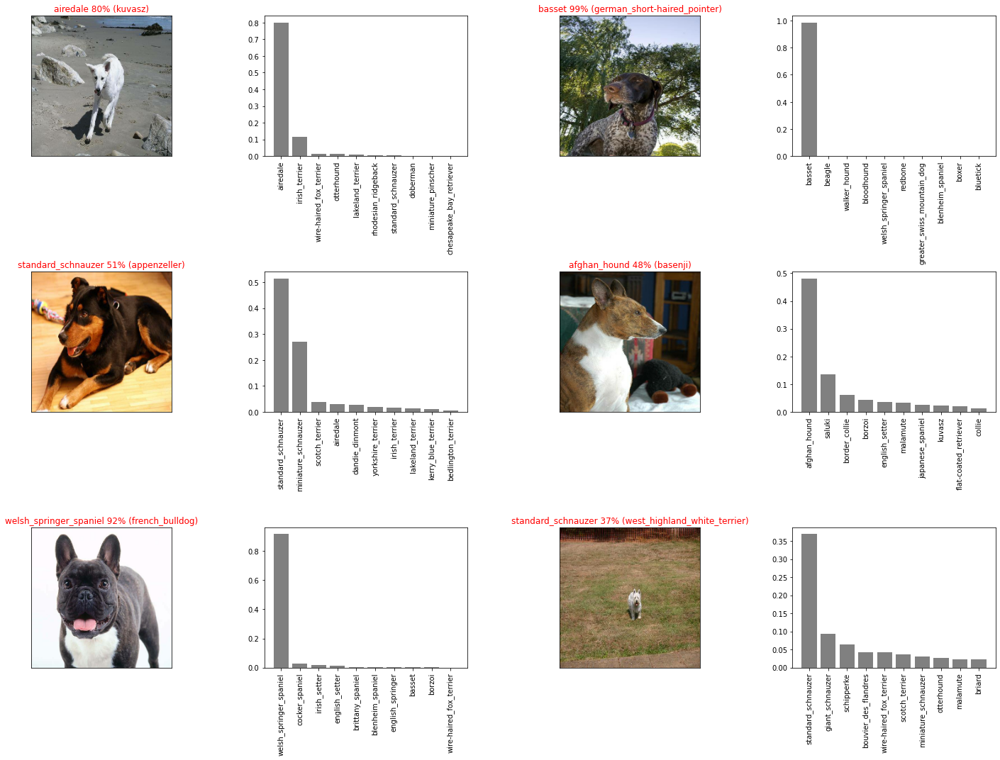

In [123]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

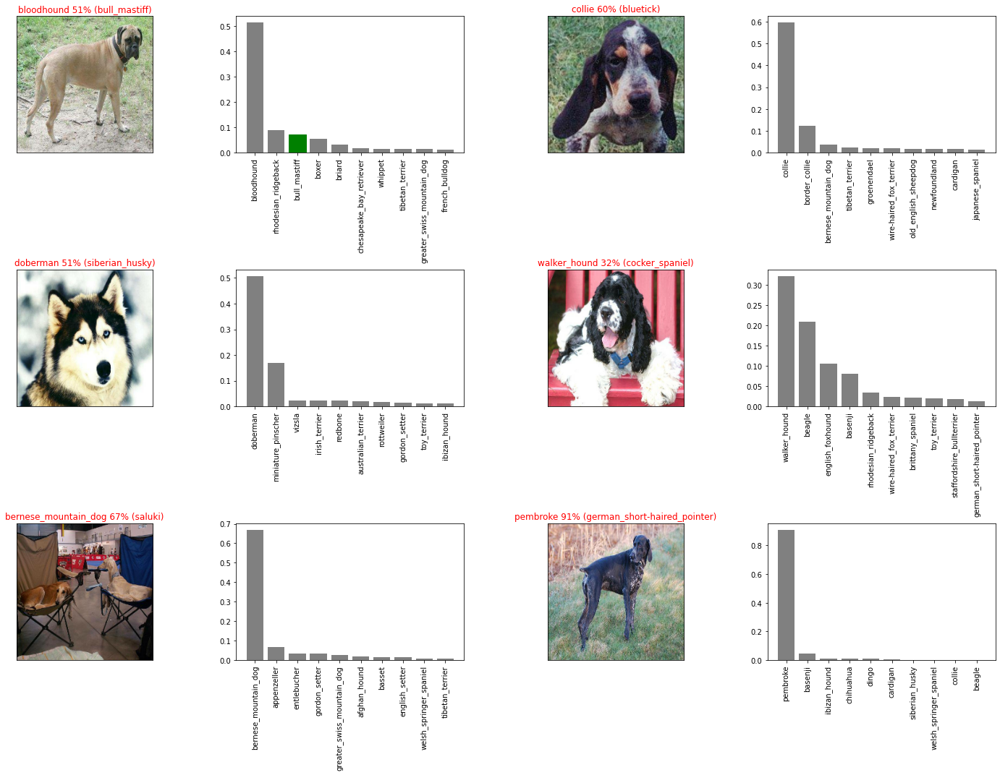

In [124]:
# Let's check a few predictions and their different values
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

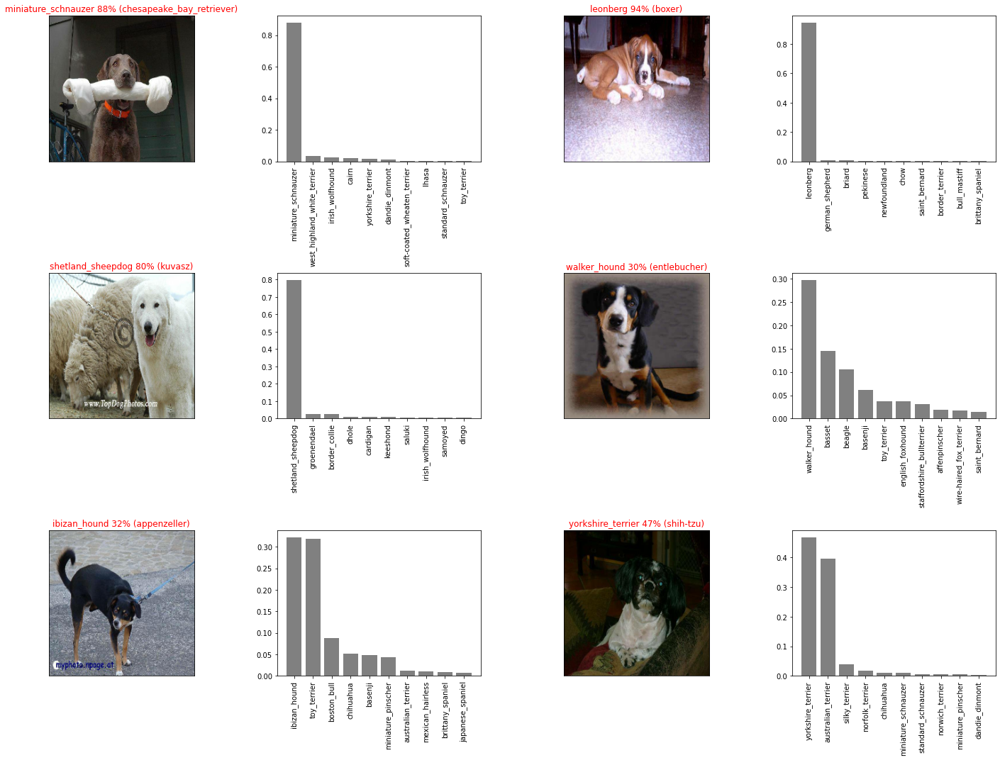

In [125]:
# Let's check a few predictions and their different values
i_multiplier = 50
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

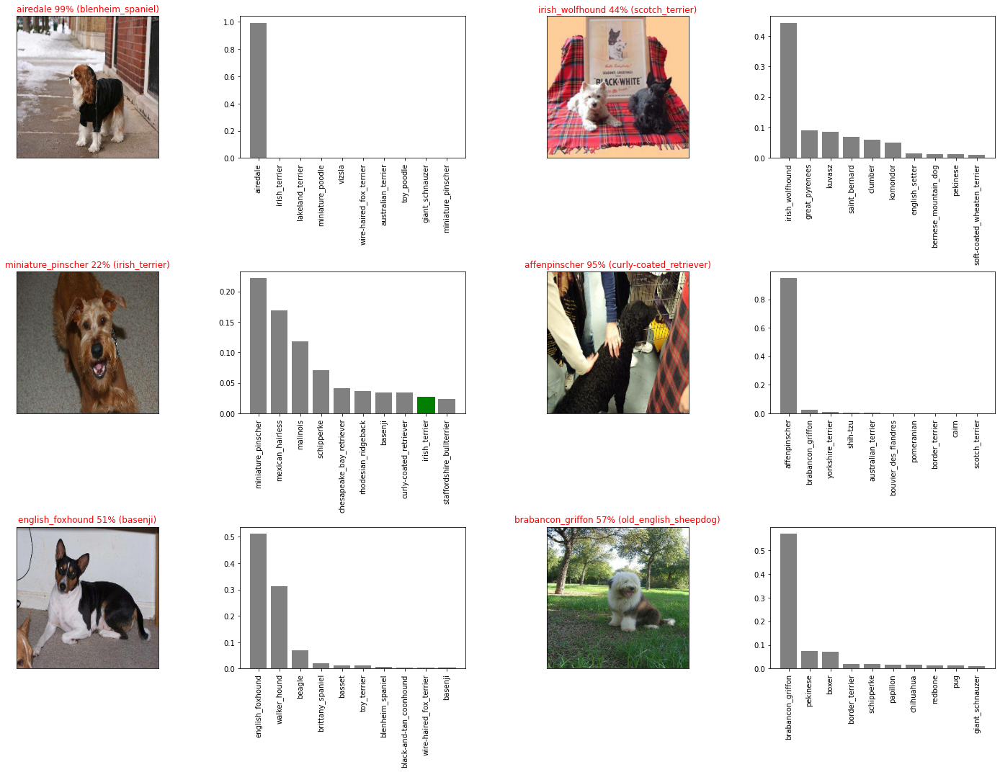

In [126]:
# Let's check a few predictions and their different values
i_multiplier = 60
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

# Saving and Reloading the model

In [127]:
# Save a model

def save_model(model, suffix=None):
  """
    Saving the currently trained model and append a suffix.
  """
  #Creating a model directory pathname to save the model
  modeldir= os.path.join('/content/drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/models', datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path= modeldir + "-" + suffix + ".h5"
  print(f'Saving the model to: {model_path}..')
  model.save(model_path)
  return model

In [128]:
# Load a saved model

def load_model(model_path):
  """
    Load a model from the model_path
  """
  print(f' Loading the saved model: {model_path}')

  model=tf.keras.models.load_model(model_path,custom_objects={"KerasLayer": hub.KerasLayer}) # Since we are importing the model from TensorFlow Hub, we have to use this 'custom_objects'.
  return model

In [129]:
save_model(model,suffix="100-images-mobilenetV2-Adam")

Saving the model to: /content/drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/models/20220130-16131643559198-100-images-mobilenetV2-Adam.h5..


In [130]:
loaded_1000_image_model=load_model('/content/drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/models/20220130-04521643518354-100-images-mobilenetV2-Adam.h5')

 Loading the saved model: /content/drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/models/20220130-04521643518354-100-images-mobilenetV2-Adam.h5


In [131]:
# Evaluating the current model

model.evaluate(valid_data)

7/7 [==============================] - 1s 122ms/step - loss: 1.4198 - accuracy: 0.6500


[1.4197604656219482, 0.6499999761581421]

In [132]:
# Evaluating the loaded model

loaded_1000_image_model.evaluate(valid_data)

7/7 [==============================] - 2s 122ms/step - loss: 0.2119 - accuracy: 0.9400


[0.21190834045410156, 0.9399999976158142]

# Training the model on the whole dataset

In [133]:
len(X), len(y)

(10222, 10222)

In [134]:
X[:10]

['./drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 './drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 './drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 './drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 './drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 './drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 './drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 './drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 './drive/MyDrive/Dog-breed-identification-data/dog-bree

In [135]:
X_train[:10]

['./drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/train/182c9134e07c883dfdc2acfb21184810.jpg',
 './drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/train/0685bcc6cdaa954771379d95d339baf6.jpg',
 './drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/train/0e7712450813da57f7df73fc45a183b4.jpg',
 './drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/train/04e3bb77c15c18fc1ac101d86d612f46.jpg',
 './drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/train/152aa0851b6a1349b99044f16eadc59d.jpg',
 './drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/train/160f87a50f4c3c80752872faa80e4699.jpg',
 './drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/train/0f5dd4999e44100d74f68c789f3edc54.jpg',
 './drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/train/17b6be0ff31a2b1e417f6a03cd3ba32e.jpg',
 './drive/MyDrive/Dog-breed-identification-data/dog-bree

In [136]:
len(X_train)

800

In [137]:
y_train[:10]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False,  True, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [138]:
len(y_val), len(X_val)

(200, 200)

In [139]:
# Create a data batch of the full dataset

full_data= create_data_batches(X,y)
full_data

Creating training data batches...


<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [140]:
# Create a model for full model

full_model=create_model()

Building the model:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [141]:
# Creating callbacks for the full model

full_model_tensorboard= create_tensorboard_callback()

# We cannot use the Early stopping callback because we are training on the whole dataset, so there is no validation set here, so we can't monitor the validation accuracy.

full_model_early_stopping= tf.keras.callbacks.EarlyStopping(monitor='accuracy', patience=3) # If the accuracy doesn't increase for 3 epochs then we will stop the model training, to prevent overfitting of the model.


In [142]:
# Fit the model with the full dataset

full_model.fit(x=full_data,epochs=NUM_EPOCHS, callbacks=[full_model_tensorboard,full_model_early_stopping]) # No validation set since we are training on the full dataset.

# 320 steps since the len of the whole/full dataset is 10222 and batch_size is 32. Hence, 10222/32 = 319.42 which rounds to 320 steps.

Epoch 1/100
320/320 [==============================] - 56s 159ms/step - loss: 1.3541 - accuracy: 0.6717
Epoch 2/100
320/320 [==============================] - 52s 161ms/step - loss: 0.4005 - accuracy: 0.8848
Epoch 3/100
320/320 [==============================] - 51s 160ms/step - loss: 0.2382 - accuracy: 0.9330
Epoch 4/100
320/320 [==============================] - 51s 160ms/step - loss: 0.1517 - accuracy: 0.9662
Epoch 5/100
320/320 [==============================] - 52s 162ms/step - loss: 0.1074 - accuracy: 0.9769
Epoch 6/100
320/320 [==============================] - 54s 170ms/step - loss: 0.0768 - accuracy: 0.9872
Epoch 7/100
320/320 [==============================] - 53s 165ms/step - loss: 0.0583 - accuracy: 0.9921
Epoch 8/100
320/320 [==============================] - 53s 165ms/step - loss: 0.0471 - accuracy: 0.9943
Epoch 9/100
320/320 [==============================] - 56s 174ms/step - loss: 0.0376 - accuracy: 0.9958
Epoch 10/100
320/320 [==============================] - 55s 172m

In [143]:
save_model(full_model, suffix='full_dataset_training_set_mobilenetV2_Adam')

Saving the model to: /content/drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/models/20220130-16341643560495-full_dataset_training_set_mobilenetV2_Adam.h5..


In [144]:
load_full_model= load_model('/content/drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/models/20220130-06061643522808-full_dataset_training_set_mobilenetV2_Adam.h5')
load_full_model

 Loading the saved model: /content/drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/models/20220130-06061643522808-full_dataset_training_set_mobilenetV2_Adam.h5


In [145]:
len(X)

10222

# Training on the Test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches.

* To make predictions on the test data, we'll:

  * Get the test image filenames.
  * Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since there are no labels with the test images).
  * Make a predictions array by passing the test data batches to the `predict()` function called on the model.


In [146]:
# Loading the test images filenames

test_path='/content/drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/test/'
test_filenames= [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/test/e7ce78e874945f182a4f5149aa505b09.jpg',
 '/content/drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/test/e37be38e73463da5a0d9f3e33263d287.jpg',
 '/content/drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/test/e18a9e69da19fc1a19885d15b7f26e92.jpg',
 '/content/drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/test/e5de4eec61d00ee4834ff0153f90ed41.jpg',
 '/content/drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/test/e6999e18a8e98f7fc33cf520d26ec521.jpg',
 '/content/drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/test/dd3eb4338145e614d325a917a35e5a1e.jpg',
 '/content/drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/test/dd1eddb779b2611cdd42de48ae623a62.jpg',
 '/content/drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/test/e1444b7c629f6775432269bfd9c7e758.jpg',
 '/conte

In [147]:
len(test_filenames)

10357

## Creating the test data batch

In [148]:
test_data= create_data_batches(test_filenames,test_data=True)
test_data # No labels since test data.

Creating test data batches..


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

## Making predictions on the test data batch using the full model that we imported above.

In [149]:
test_predictions=load_full_model.predict(test_data,verbose=1) 

# 324 batches. Because we have 10357 images on the test dataset and the batch_size is 32. So 10357/32= 323.65 and rounded to 324. That's why 324 batches. 

324/324 [==============================] - 167s 504ms/step


### Saving the predictions to a csv file using Numpy

In [150]:
# Save the predictions(Numpy array) to a csv file(for access later)
np.savetxt('/content/drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/prediction_array.csv', test_predictions, delimiter=',')

In [151]:
# Loading the predictions(Numpy array) from csv file
loaded_test_predictions=np.loadtxt('/content/drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/prediction_array.csv', delimiter=',')
loaded_test_predictions[:10]

array([[6.11157418e-08, 7.34947797e-11, 1.10912506e-05, ...,
        1.43367873e-10, 3.36490347e-09, 7.45313741e-07],
       [3.11791922e-07, 1.59013702e-09, 9.40434788e-08, ...,
        2.54737431e-09, 1.96885187e-04, 9.41220522e-01],
       [2.66941291e-09, 9.25454713e-11, 8.80817502e-11, ...,
        1.07015630e-07, 3.51493695e-10, 2.73146631e-12],
       ...,
       [3.09773818e-10, 5.41036747e-12, 1.20984514e-10, ...,
        1.85898173e-07, 1.29943084e-10, 5.47684342e-10],
       [8.37503331e-11, 2.33351693e-05, 1.19786248e-09, ...,
        3.26408234e-08, 2.26824271e-11, 2.75363465e-11],
       [1.31807845e-08, 1.02997520e-10, 2.32113800e-10, ...,
        5.37802691e-09, 4.78707785e-12, 7.65315988e-08]])

In [152]:
loaded_test_predictions.shape

(10357, 120)

# Preparing the test dataset predictions for Kaggle

> The Kaggle submission wants the model's prediction probability outputs in a DataFrame with the ID of the images and a column for each of the unique dog breeds.

Link -> https://www.kaggle.com/c/dog-breed-identification/data?select=sample_submission.csv


To get the data in this format, we'll:

* Create a pandas DataFrame with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns using the unique_breeds list and the test_predictions list.
Export the DataFrame as a CSV to submit it to Kaggle.


In [153]:
list(unique_breeds)

['affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenendael',


In [154]:
['id'] + list(unique_breeds)

['id',
 'affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenen

In [155]:
# Creating pandas DataFrame with empty columns

preds_df= pd.DataFrame(columns=['id'] + list(unique_breeds))

In [156]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [159]:
test_filenames[:5]

['/content/drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/test/e7ce78e874945f182a4f5149aa505b09.jpg',
 '/content/drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/test/e37be38e73463da5a0d9f3e33263d287.jpg',
 '/content/drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/test/e18a9e69da19fc1a19885d15b7f26e92.jpg',
 '/content/drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/test/e5de4eec61d00ee4834ff0153f90ed41.jpg',
 '/content/drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/test/e6999e18a8e98f7fc33cf520d26ec521.jpg']

In [158]:
test_path

'/content/drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/test/'

In [167]:
# Append the test image ID's to predictions DataFrame

test_ids=[os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df['id']=test_ids
test_ids[:5] # Getting the IDs of the images in the test dataset

['e7ce78e874945f182a4f5149aa505b09',
 'e37be38e73463da5a0d9f3e33263d287',
 'e18a9e69da19fc1a19885d15b7f26e92',
 'e5de4eec61d00ee4834ff0153f90ed41',
 'e6999e18a8e98f7fc33cf520d26ec521']

In [164]:
os.path.splitext(test_filenames[0])

('/content/drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/test/e7ce78e874945f182a4f5149aa505b09',
 '.jpg')

In [168]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e7ce78e874945f182a4f5149aa505b09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e37be38e73463da5a0d9f3e33263d287,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e18a9e69da19fc1a19885d15b7f26e92,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e5de4eec61d00ee4834ff0153f90ed41,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e6999e18a8e98f7fc33cf520d26ec521,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [169]:
# Add the prediction probabilites to each dog breed column

preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e7ce78e874945f182a4f5149aa505b09,6.11157e-08,7.34948e-11,1.10913e-05,3.37338e-14,2.17949e-09,7.27099e-08,9.26745e-09,4.44868e-09,1.6561e-12,2.73156e-12,6.77748e-11,1.78064e-09,4.17819e-09,9.42625e-11,2.59471e-08,7.56909e-10,5.86325e-07,2.63598e-10,5.22155e-11,9.11141e-07,2.02097e-09,4.3397e-13,4.61226e-08,1.99e-07,4.56163e-08,1.98535e-11,3.7366e-10,3.42156e-07,9.18301e-09,1.48256e-05,4.58455e-09,1.65987e-08,1.1715e-09,1.41037e-07,1.54693e-06,3.1477e-09,6.51804e-07,2.21419e-07,5.36889e-09,...,1.00103e-05,4.41652e-07,2.30386e-12,2.75021e-10,2.73998e-07,1.10643e-11,1.94497e-07,9.62779e-08,7.29848e-09,1.77625e-08,1.38951e-12,1.32793e-10,4.18274e-11,8.41479e-12,4.84654e-09,0.818231,2.83639e-06,9.07615e-08,1.28336e-09,1.73771e-09,5.65783e-09,6.93891e-07,4.36006e-11,7.28578e-10,2.13979e-06,9.93303e-08,4.14395e-10,5.80954e-07,4.12721e-07,8.92152e-09,1.23361e-07,4.98755e-09,4.26501e-09,5.48264e-11,2.7707e-08,9.81421e-11,2.36469e-09,1.43368e-10,3.3649e-09,7.45314e-07
1,e37be38e73463da5a0d9f3e33263d287,3.11792e-07,1.59014e-09,9.40435e-08,5.64141e-09,7.2642e-09,5.06741e-10,0.0423069,2.42813e-08,8.86746e-11,9.46549e-10,1.19305e-10,1.49687e-06,4.79865e-07,4.17343e-09,3.33013e-10,1.2306e-09,3.5865e-06,4.24914e-07,2.74358e-10,3.56176e-07,6.38793e-11,9.65556e-10,2.07374e-07,1.25474e-06,7.19365e-10,9.31352e-10,3.98424e-05,4.88576e-09,1.61723e-11,3.97672e-06,1.33346e-10,2.3099e-09,6.29676e-10,2.85304e-08,1.90291e-11,3.27719e-09,5.68316e-09,1.08109e-09,4.99981e-08,...,8.36161e-08,3.70988e-06,1.83389e-10,7.38782e-07,9.03716e-07,1.54751e-07,2.27433e-08,6.21948e-08,2.89292e-10,2.82916e-09,5.90808e-11,4.0769e-11,1.44367e-12,4.64659e-09,3.90228e-10,2.10212e-07,6.71853e-10,1.40251e-07,3.49283e-10,7.90259e-07,1.79609e-07,8.7742e-11,0.00387103,1.37489e-10,1.07749e-08,5.8373e-12,1.31585e-06,3.89927e-08,3.47062e-11,2.24716e-07,1.06755e-09,0.0122553,1.46926e-08,2.61356e-10,3.15391e-09,8.79029e-09,4.05037e-07,2.54737e-09,0.000196885,0.941221
2,e18a9e69da19fc1a19885d15b7f26e92,2.66941e-09,9.25455e-11,8.80818e-11,8.26177e-12,9.41337e-07,5.49155e-10,5.37885e-11,1.07213e-12,6.65216e-12,1.92646e-08,2.39532e-08,7.39046e-13,1.30522e-08,1.76657e-09,8.96404e-10,2.04444e-08,1.87921e-13,2.17901e-09,1.36803e-08,1.48988e-12,8.09146e-10,1.59071e-10,8.36293e-10,2.60718e-10,1.28525e-08,5.01379e-07,9.09454e-12,8.22796e-12,8.64152e-06,2.8868e-09,8.08891e-12,1.95657e-10,6.458e-09,6.02817e-09,2.97556e-05,6.71824e-10,1.32806e-11,1.91426e-09,5.61893e-11,...,1.04892e-11,8.70751e-12,6.56214e-09,6.72744e-09,1.7412e-10,4.01425e-10,9.6444e-13,2.68383e-11,8.78143e-09,2.43022e-08,8.10774e-07,1.74682e-08,1.55939e-09,1.04258e-09,9.09145e-11,3.41124e-12,2.62182e-10,5.9278e-08,7.78942e-08,3.02154e-10,1.66437e-08,8.00296e-10,3.24205e-10,1.55239e-09,1.83036e-07,1.58002e-09,1.78417e-11,2.73963e-09,1.19577e-10,3.45271e-11,6.36912e-10,8.11093e-10,4.53237e-07,1.29007e-06,1.02657e-08,8.45243e-12,3.10693e-11,

In [170]:
preds_df.shape

(10357, 121)

# Saving the predictions dataframe in a CSV file for submission in Kaggle.

In [172]:
preds_df.to_csv('/content/drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/full_model_prediction_mobilenetV2_submission_1.csv',index=False)

# Making predictions on custom images

It's great being able to make predictions on a test dataset already provided for us.

But how could we use our model on our own images?

The premise remains, if we want to make predictions on our own custom images, we have to pass them to the model in the same format the model was trained on.

The steps needed are:

* Get the filepaths of our own images.
* Turn the filepaths into data batches using create_data_batches(). And since our custom images won't have labels, we set the test_data parameter to True.
* Pass the custom image data batch to our model's predict() method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.


In [178]:
# Getting the custom image filepaths

custom_path='/content/drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/custom_dog_images/'
custom_images_path= [custom_path + fname for fname in os.listdir(custom_path)]

In [179]:
custom_images_path

['/content/drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/custom_dog_images/image1.jpeg',
 '/content/drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/custom_dog_images/image2.jpeg',
 '/content/drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/custom_dog_images/image3.jpeg',
 '/content/drive/MyDrive/Dog-breed-identification-data/dog-breed-identification/custom_dog_images/image4.jpeg']

In [180]:
# Turn custom images into batch datasets
custom_data= create_data_batches(custom_images_path, test_data=True)
custom_data

Creating test data batches..


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [182]:
# Making predictions on the custom data
custom_preds= load_full_model.predict(custom_data)
custom_preds[:5]

array([[2.91761698e-10, 4.09875778e-09, 5.42948442e-07, 1.17967811e-05,
        5.55119284e-10, 2.95299714e-08, 5.83943483e-06, 1.24317168e-09,
        1.84203180e-10, 1.11071049e-05, 9.87443105e-09, 2.55544408e-09,
        1.73359365e-06, 3.65966679e-09, 7.87499903e-06, 1.73876789e-08,
        5.77429038e-09, 1.97961199e-05, 1.84415612e-07, 3.84582080e-07,
        3.72672934e-11, 6.48681242e-09, 1.17877725e-07, 2.21156213e-08,
        6.81498875e-08, 1.32126177e-08, 2.03609551e-09, 1.55888017e-06,
        2.81926282e-09, 1.94895421e-07, 2.47595211e-09, 7.40714441e-08,
        4.51147208e-09, 9.01008548e-07, 3.43406761e-08, 5.45574830e-09,
        1.00418879e-02, 3.44861968e-04, 7.23513767e-06, 8.46754233e-07,
        1.03473683e-08, 1.82751123e-11, 8.04786637e-08, 1.30061656e-02,
        1.52842450e-09, 9.34417301e-07, 9.73099172e-01, 4.99289721e-09,
        3.86579302e-08, 3.60082186e-06, 1.99369730e-08, 1.12321918e-09,
        9.09966380e-10, 4.42698990e-07, 9.98250940e-08, 1.216966

In [184]:
custom_preds.shape # We have 4 images and 120 prediction probabilities for each of the images.

(4, 120)

In [185]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['german_shepherd', 'golden_retriever', 'samoyed', 'pembroke']

In [186]:
# Get custom images (our unbatchify() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

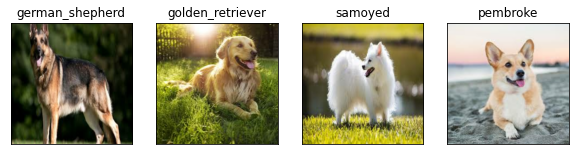

In [188]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 4, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)